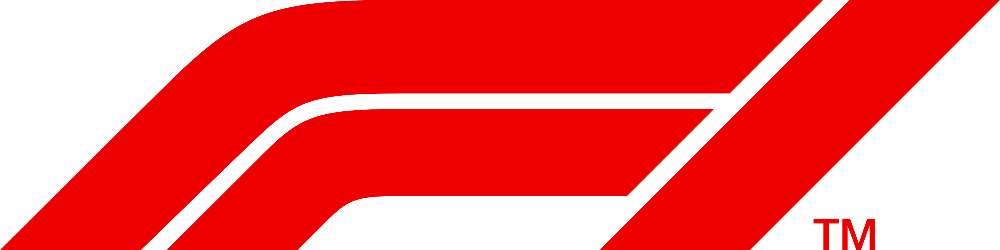

# Formula 1 - Exploratory Data Analysis

### Table of Contents
        1. Circuits
            - Visualising circuits around the world on a world map using clusters.
            - Top 10 countries by number of circuits.
            - Most hosted Grand Prix.
            - What are the circuits climate zones?
        2. Drivers
            - What are the average points scored by drivers after 2010?
            - Which driver has the most Formula 1 victories?
            - Drivers and their pair wise relationships to winning and time taken per lap.
            - Driver status and their fastest laps.
            - Which drivers have the best pitstop timings?
            - Which countries are the old and new drivers from?
        3. Constructors
            - Which nationality do most constructors belong to?
            - Which constructors have won the most number of races?
            - Total points of constructors over the years.

# Import Libraries

In [ ]:
import os
import warnings
import numpy as np
import pandas as pd
warnings.filterwarnings('ignore')

# Data visualisation libraries
import plotly.offline as py # Plotly
from plotly import tools
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected = True)  

import folium                               # for visualizing geospatial data                                      
import seaborn as sns
import matplotlib.pyplot as plt             # for plotting graphs
from matplotlib import rcParams             # for validating 
from folium.plugins import MarkerCluster    # for visualising clusters

%matplotlib inline

In [ ]:
import random
def random_colors(number_of_colors):
    color = ["#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)])
                 for i in range(number_of_colors)]
    return color

In [94]:
import datetime
datetime.datetime.strptime

<function datetime.strptime>

# Analysis of Circuits

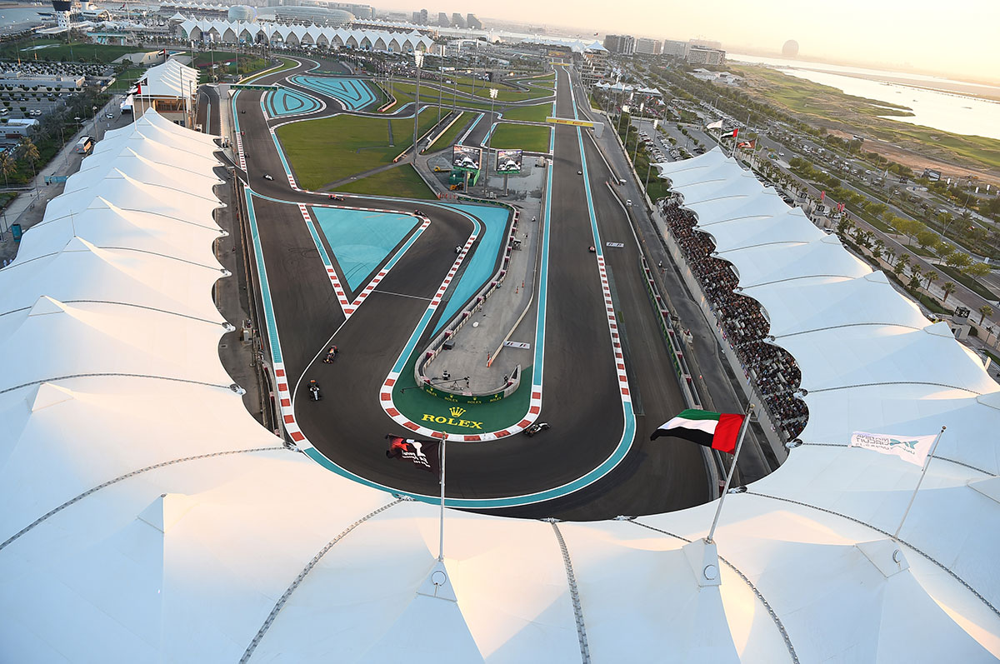

In [3]:
circuits = pd.read_csv('./race-data/circuits.csv', encoding='ISO-8859-1')

Exploring the features of this data

In [4]:
print(circuits.columns.values)

['circuitId' 'circuitRef' 'name' 'location' 'country' 'lat' 'lng' 'alt'
 'url']


In [5]:
# preview of the data
circuits.head()

,circuitId,circuitRef,name,location,country,lat,lng,alt,url
0,1,albert_park,Albert Park Grand Prix Circuit,Melbourne,Australia,-37.84970,144.96800,10.0,http://en.wikipedia.org/wiki/Melbourne_Grand_P...
1,2,sepang,Sepang International Circuit,Kuala Lumpur,Malaysia,2.76083,101.73800,NaN,http://en.wikipedia.org/wiki/Sepang_Internatio...
2,3,bahrain,Bahrain International Circuit,Sakhir,Bahrain,26.03250,50.51060,NaN,http://en.wikipedia.org/wiki/Bahrain_Internati...
3,4,catalunya,Circuit de Barcelona-Catalunya,MontmelÌ_,Spain,41.57000,2.26111,NaN,http://en.wikipedia.org/wiki/Circuit_de_Barcel...
4,5,istanbul,Istanbul Park,Istanbul,Turkey,40.95170,29.40500,NaN,http://en.wikipedia.org/wiki/Istanbul_Park


Are there any features with null or missing values?
They will need to be corrected.

In [6]:
circuits.isna().sum()

circuitId      0
circuitRef     0
name           0
location       0
country        0
lat            0
lng            0
alt           72
url            0
dtype: int64

Since alt contains 72 null values of 73 total, and we won't take this feature into consideration during our research. It will be dropped.

In [7]:
circuits = circuits.drop(['alt'], axis = 1)

In [8]:
# Now we need to see the data types of our features
circuits.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73 entries, 0 to 72
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   circuitId   73 non-null     int64  
 1   circuitRef  73 non-null     object 
 2   name        73 non-null     object 
 3   location    73 non-null     object 
 4   country     73 non-null     object 
 5   lat         73 non-null     float64
 6   lng         73 non-null     float64
 7   url         73 non-null     object 
dtypes: float64(2), int64(1), object(5)
memory usage: 4.7+ KB


### Visualising circuits around the world on a world map using clusters

This graphical representation should be really useful to determine the overall amount of racetracks in each continent.

In [9]:
circuits_folium = circuits[['name', 'location', 'country', 'lat', 'lng']]
circuits_folium.head()

,name,location,country,lat,lng
0,Albert Park Grand Prix Circuit,Melbourne,Australia,-37.84970,144.96800
1,Sepang International Circuit,Kuala Lumpur,Malaysia,2.76083,101.73800
2,Bahrain International Circuit,Sakhir,Bahrain,26.03250,50.51060
3,Circuit de Barcelona-Catalunya,MontmelÌ_,Spain,41.57000,2.26111
4,Istanbul Park,Istanbul,Turkey,40.95170,29.40500


In [193]:
circuits_map = folium.Map(tiles="cartodbpositron")
marker_cluster = MarkerCluster().add_to(circuits_map)
for i in range(len(circuits_folium)):
    lat = circuits_folium.iloc[i]['lat']
    lng = circuits_folium.iloc[i]['lng']
    radius = 5
    popup_text = circuits_folium.iloc[i]['name']
    folium.CircleMarker(location = [lat, lng], radius = radius, 
                        popup = popup_text, fill = True).add_to(marker_cluster)
circuits_map

### Top 10 countries by number of circuits

In [11]:
country = circuits[['country', 'name']].groupby(['country'], as_index = False).count().sort_values(by = 'name', ascending = False)

In [12]:
country = country[['country','name']][:10]
country.shape

(10, 2)

In [13]:
data = [go.Bar(x = country['country'],
               y = country['name'],
               marker = dict(color = random_colors(100)))]

layout = dict(title = "Countries with Most F1 Circuits")
fig = dict(data = data, layout = layout)
iplot(fig, validate = False)

### Most hosted Grand Prix

In [14]:
races = pd.read_csv('./race-data/races.csv')
races.head()

,raceId,year,round,circuitId,name,date,time,url
0,1,2009,1,1,Australian Grand Prix,2009-03-29,06:00:00,http://en.wikipedia.org/wiki/2009_Australian_G...
1,2,2009,2,2,Malaysian Grand Prix,2009-04-05,09:00:00,http://en.wikipedia.org/wiki/2009_Malaysian_Gr...
2,3,2009,3,17,Chinese Grand Prix,2009-04-19,07:00:00,http://en.wikipedia.org/wiki/2009_Chinese_Gran...
3,4,2009,4,3,Bahrain Grand Prix,2009-04-26,12:00:00,http://en.wikipedia.org/wiki/2009_Bahrain_Gran...
4,5,2009,5,4,Spanish Grand Prix,2009-05-10,12:00:00,http://en.wikipedia.org/wiki/2009_Spanish_Gran...


In [15]:
win_count = races['name'].value_counts()
data = [go.Bar(x = win_count.index,
               y = win_count.values,
               marker = dict(color = random_colors(100)))]

layout = dict(title = "No of Most Hosted Grand Prix (Upto 2017)")
fig = dict(data = data, layout = layout)
iplot(fig, validate = False)

### What are the circuits climate zones?

In [16]:
climate_zone = ['mwc', 'troprain', 'des', 'mwc', 'mwc', 'med', 'hcont', 'mwc', 'mwc', 'mwc', 'mwc', 'med', 'mwc', 'mwc', 'troprain', 'humsub', 'humsub', 'tropsav', 'hcont', 'mwc', 'mwc', 'humsub', 'mwc', 'des', 'humsub', 'med', 'med', 'humsub', 'steppe', 'humsub', 'mwc', 'humsub', 'des', 'med', 'humsub', 'humsub', 'humsub', 'mwc', 'mwc', 'mwc', 'mwc', 'humsub', 'steppe', 'humsub', 'med', 'hcont', 'mwc', 'sarc', 'mwc', 'mwc', 'mwc', 'hcont', 'mwc', 'mwc', 'mwc', 'mwc', 'hcont', 'mwc', 'med', 'steppe', 'mwc', 'med', 'humsub', 'med', 'mwc', 'mwc', 'mwc', 'humsub', 'humsub', 'hcont', 'mwc', 'humsub', 'steppe']
circuits['climate_zone'] = climate_zone
circuits_climate = circuits[['climate_zone','name']].groupby(['climate_zone'], as_index = False).count().sort_values(by='name', ascending = False)

circuits_climate.shape

(9, 2)

In [17]:
climate_label = {'Name': ['Marine West Coast', 'Humid Subtropical', 'Mediterranean', 'Humid Continental', 
         'Steppe', 'Dessert', 'Tropical Rain', 'Polar', 'Tropical Sav']}
circuits_climate['climate_zone'] = climate_label['Name']

trace = go.Pie(labels = circuits_climate['climate_zone'], 
               values = circuits_climate['name'], 
               hole = 0.6, textinfo = 'none')

layout = go.Layout(title='Climate Zones with F1 Circuits')
fig = go.Figure(data = [trace], layout = layout)
iplot(fig, filename = "plotting-library")

# Analysis of Drivers

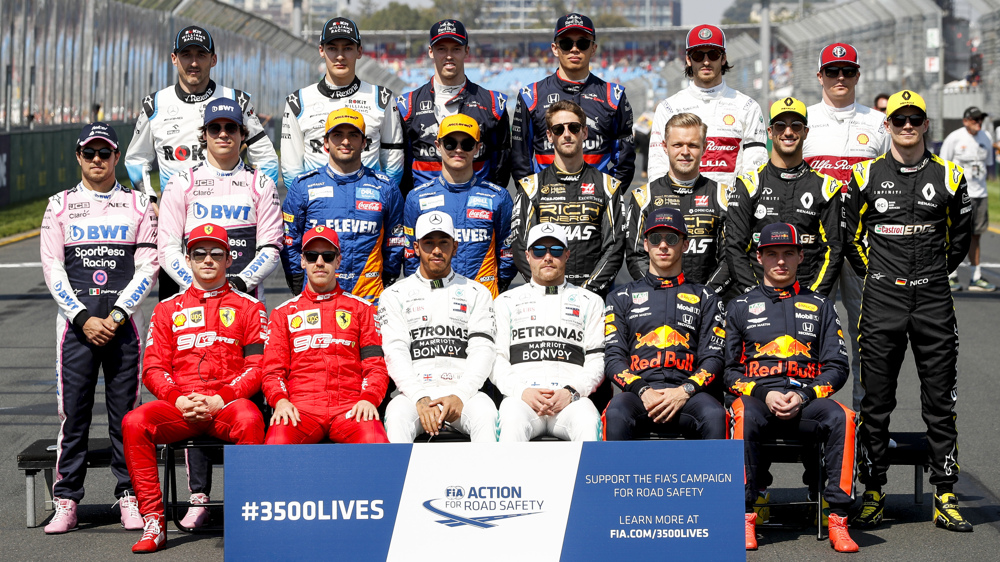

In [36]:
drivers2 = pd.read_csv('./race-data-2/drivers.csv')
results2 = pd.read_csv('./race-data-2/results.csv')
race2 = pd.read_csv('./race-data-2/races.csv')

### What are the average points scored by drivers after 2010?

In [37]:
# Merge all three datasets and filter out races before 2010 
df1 = pd.merge(results2, drivers2, on = 'driverId')
df2 = pd.merge(df1, race2, on = 'raceId')
results1 = df2
results2 = df2[df2.year > 2009]

Exploring the features of this data

In [46]:
print(results2.columns.values)

['resultId' 'raceId' 'driverId' 'constructorId' 'number_x' 'grid'
 'position' 'positionText' 'positionOrder' 'points' 'laps' 'time_x'
 'milliseconds' 'fastestLap' 'rank' 'fastestLapTime' 'fastestLapSpeed'
 'statusId' 'driverRef' 'number_y' 'code' 'forename' 'surname' 'dob'
 'nationality' 'url_x' 'year' 'round' 'circuitId' 'name' 'date' 'time_y'
 'url_y' 'driver']


In [47]:
results2.head()

,resultId,raceId,driverId,constructorId,number_x,grid,position,positionText,positionOrder,points,...,nationality,url_x,year,round,circuitId,name,date,time_y,url_y,driver
1082,20325,337,1,1,2,4,3,3,3,15.0,...,British,http://en.wikipedia.org/wiki/Lewis_Hamilton,2010,1,3,Bahrain Grand Prix,2010-03-14,12:00:00,http://en.wikipedia.org/wiki/2010_Bahrain_Gran...,Lewis Hamilton
1083,20327,337,3,131,4,5,5,5,5,10.0,...,German,http://en.wikipedia.org/wiki/Nico_Rosberg,2010,1,3,Bahrain Grand Prix,2010-03-14,12:00:00,http://en.wikipedia.org/wiki/2010_Bahrain_Gran...,Nico Rosberg
1084,20323,337,4,6,8,3,1,1,1,25.0,...,Spanish,http://en.wikipedia.org/wiki/Fernando_Alonso,2010,1,3,Bahrain Grand Prix,2010-03-14,12:00:00,http://en.wikipedia.org/wiki/2010_Bahrain_Gran...,Fernando Alonso
1085,20337,337,5,205,19,21,15,15,15,0.0,...,Finnish,http://en.wikipedia.org/wiki/Heikki_Kovalainen,2010,1,3,Bahrain Grand Prix,2010-03-14,12:00:00,http://en.wikipedia.org/wiki/2010_Bahrain_Gran...,Heikki Kovalainen
1086,20333,337,9,4,11,9,11,11,11,0.0,...,Polish,http://en.wikipedia.org/wiki/Robert_Kubica,2010,1,3,Bahrain Grand Prix,2010-03-14,12:00:00,http://en.wikipedia.org/wiki/2010_Bahrain_Gran...,Robert Kubica


Driver data has forename and surname fields. For visualisation, these are combined to show the full name.

In [38]:
# Create driver name field from forename and surname
results2["driver"] = results2["forename"] + " " + results2["surname"]

In [39]:
# Aggregate total points and average points per race
avg_pts = results2[['driver', 'points']].groupby("driver").mean()
total_pts = results2[['driver', 'points']].groupby("driver").sum()

In [40]:
# Count number of races for each driver and filter out drivers with less than 100 races
n = results2[['driver', 'raceId']].groupby("driver").count()
num_races = n[n.raceId > 100]

In [41]:
# Merge the above summary tables and reset index to create column for driver name
d = pd.merge(avg_pts, total_pts, on = 'driver')
md = pd.merge(d, num_races, on = 'driver')
md = md.reset_index()

md.iloc[7, 3] = 180 #data correction
md.iloc[6, 3] = 125 #data correction

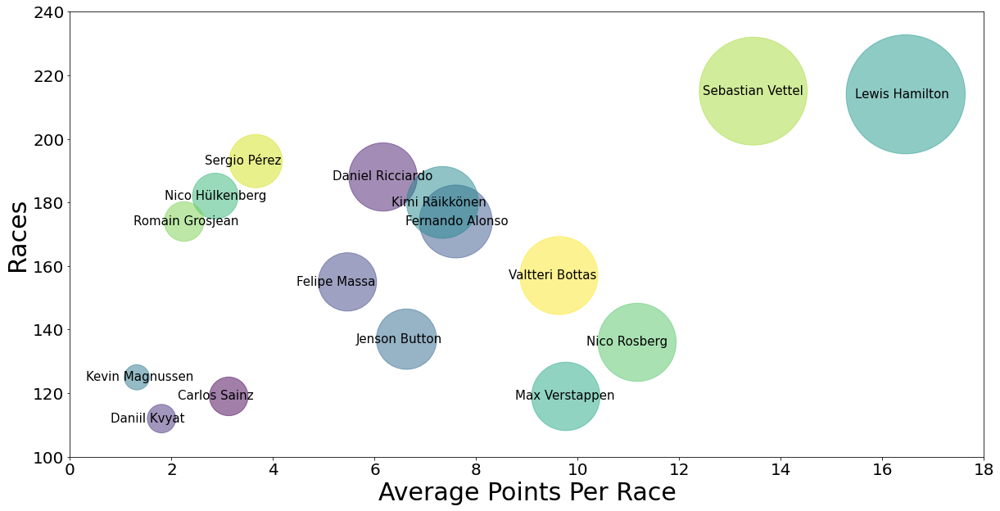

In [42]:
# Create bubble chart with size of the bubble showing total points scored in the decade
plt.rc('font', size = 15)          # controls default text sizes
plt.rc('axes', titlesize = 30)     # fontsize of the axes title
plt.rc('axes', labelsize = 30)     # fontsize of the x and y labels
plt.rc('xtick', labelsize = 20)    # fontsize of the tick labels
plt.rc('ytick', labelsize = 20)    # fontsize of the tick labels
plt.rc('legend', fontsize = 30)    # legend fontsize
plt.rc('figure', titlesize = 30)   # fontsize of the figure title

plt.figure(figsize = (20, 10))
plt.scatter(md.points_x, md.raceId, s = md.points_y * 6, alpha = 0.5, c = md.index.to_series())
plt.xlim(0, 18)
plt.ylim(100, 240)

plt.xlabel("Average Points Per Race")
plt.ylabel("Races")

for x, y, z in zip(md.points_x, md.raceId, md.driver):
   plt.annotate(z, xy = (x - 1, y - 1)) 

### Which driver has the most Formula 1 victories?

In [61]:
drivers3 = pd.read_csv('./race-data/drivers.csv', encoding='latin1')
drivers3.head()

,driverId,driverRef,number,code,forename,surname,dob,nationality,url
0,1,hamilton,44.0,HAM,Lewis,Hamilton,07/01/1985,British,http://en.wikipedia.org/wiki/Lewis_Hamilton
1,2,heidfeld,NaN,HEI,Nick,Heidfeld,10/05/1977,German,http://en.wikipedia.org/wiki/Nick_Heidfeld
2,3,rosberg,6.0,ROS,Nico,Rosberg,27/06/1985,German,http://en.wikipedia.org/wiki/Nico_Rosberg
3,4,alonso,14.0,ALO,Fernando,Alonso,29/07/1981,Spanish,http://en.wikipedia.org/wiki/Fernando_Alonso
4,5,kovalainen,NaN,KOV,Heikki,Kovalainen,19/10/1981,Finnish,http://en.wikipedia.org/wiki/Heikki_Kovalainen


In [62]:
driver_standings = pd.read_csv('./race-data/driverStandings.csv')
driver_standings.head()

,driverStandingsId,raceId,driverId,points,position,positionText,wins
0,1,18,1,10.0,1,1,1
1,2,18,2,8.0,2,2,0
2,3,18,3,6.0,3,3,0
3,4,18,4,5.0,4,4,0
4,5,18,5,4.0,5,5,0


In [63]:
driver_standings = driver_standings.fillna(0)

In [105]:
results3 = driver_standings.merge(drivers3, how = 'left', on = 'driverId')

In [111]:
results_filtered = results3[results3['position'] == 1]
results_filtered.head()

,driverStandingsId,raceId,driverId,points,position,positionText,wins,driverRef,number,code,forename,surname,dob,nationality,url
0,1,18,1,10.0,1,1,1,hamilton,44.0,HAM,Lewis,Hamilton,1985-07-01,British,http://en.wikipedia.org/wiki/Lewis_Hamilton
8,9,19,1,14.0,1,1,1,hamilton,44.0,HAM,Lewis,Hamilton,1985-07-01,British,http://en.wikipedia.org/wiki/Lewis_Hamilton
33,34,20,8,19.0,1,1,1,raikkonen,7.0,RAI,Kimi,RÌ_ikkÌ¦nen,1979-10-17,Finnish,http://en.wikipedia.org/wiki/Kimi_R%C3%A4ikk%C...
54,55,21,8,29.0,1,1,2,raikkonen,7.0,RAI,Kimi,RÌ_ikkÌ¦nen,1979-10-17,Finnish,http://en.wikipedia.org/wiki/Kimi_R%C3%A4ikk%C...
75,76,22,8,35.0,1,1,2,raikkonen,7.0,RAI,Kimi,RÌ_ikkÌ¦nen,1979-10-17,Finnish,http://en.wikipedia.org/wiki/Kimi_R%C3%A4ikk%C...


In [125]:
# Top 5 Drivers

results4 = results_filtered['surname'].value_counts()
results4 = results4.head(5)
radar = go.Scatterpolar(r = results4.values,
                        theta = results4.index,
                        fill = 'toself')

data = [radar]
fig = go.Figure(data = data)
iplot(fig)

In [126]:
win_count = results_filtered['surname'].value_counts()
data = [go.Bar(x = win_count.values,
               y = win_count.index,
               orientation = 'h',
               marker = dict(color = random_colors(100)))]

layout = dict(title = "Wins by Drivers (Upto 2017)")
fig = dict(data = data, layout = layout)
iplot(fig, validate = False)

In [68]:
win_count = results_filtered['surname'].value_counts()
trace = go.Pie(labels = win_count.index, 
               values = win_count.values, 
               hole = 0.6, textinfo = 'none')

layout = go.Layout(title = 'Win Percentage by Drivers (Upto 2017)')
fig = go.Figure(data=[trace], layout=layout)
iplot(fig, filename="plotting-library")

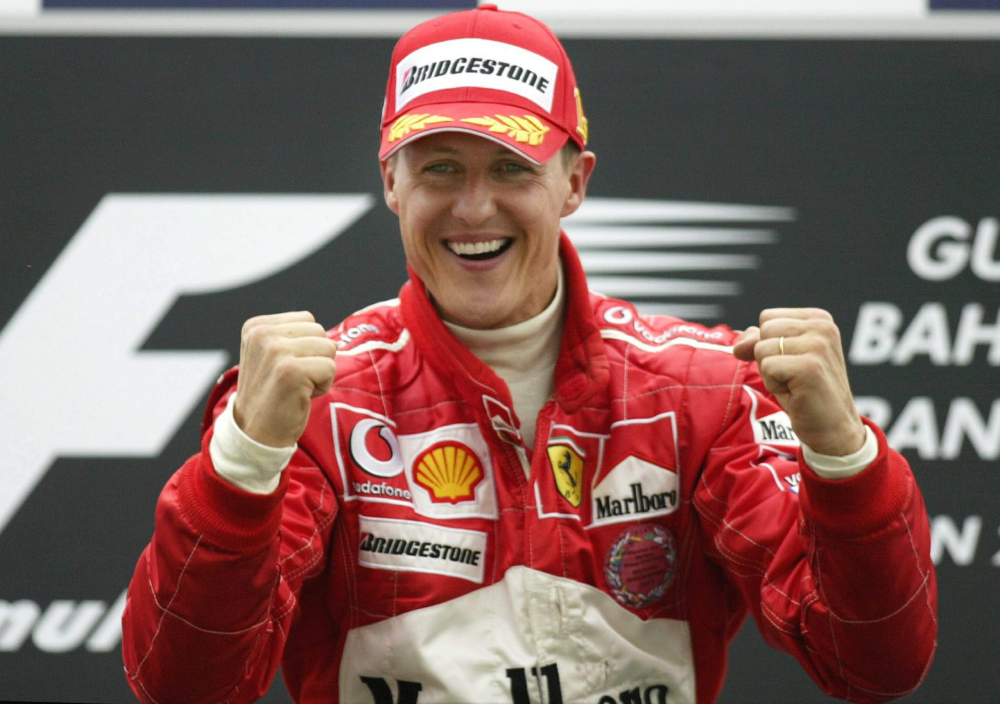

### Drivers and their pair wise relationships to winning and time taken per lap

In [70]:
laptimes = pd.read_csv('./race-data/lapTimes.csv')
laptimes.head()

,raceId,driverId,lap,position,time,milliseconds
0,841,20,1,1,1:38.109,98109
1,841,20,2,1,1:33.006,93006
2,841,20,3,1,1:32.713,92713
3,841,20,4,1,1:32.803,92803
4,841,20,5,1,1:32.342,92342


In [72]:
laptimes1 = laptimes.merge(drivers3, how = 'left', on = 'driverId')

In [74]:
laptimes1 = laptimes1[['lap', 'position', 'surname', 'time', 'milliseconds']]

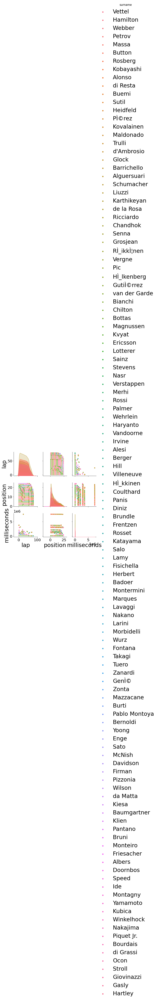

In [76]:
lt = sns.pairplot(laptimes1, hue = 'surname')

### Driver status and their fastest laps

In [78]:
race_results = pd.read_csv('./race-data/results.csv')
status = pd.read_csv('./race-data/status.csv')

In [79]:
new_results = race_results.merge(status, how = 'left', on = 'statusId')
new_results.head()

,resultId,raceId,driverId,constructorId,number,grid,position,positionText,positionOrder,points,laps,time,milliseconds,fastestLap,rank,fastestLapTime,fastestLapSpeed,statusId,status
0,1,18,1,1,22.0,1,1.0,1,1,10.0,58,34:50.6,5690616.0,39.0,2.0,01:27.5,218.3,1,Finished
1,2,18,2,2,3.0,5,2.0,2,2,8.0,58,5.478,5696094.0,41.0,3.0,01:27.7,217.586,1,Finished
2,3,18,3,3,7.0,7,3.0,3,3,6.0,58,8.163,5698779.0,41.0,5.0,01:28.1,216.719,1,Finished
3,4,18,4,4,5.0,11,4.0,4,4,5.0,58,17.181,5707797.0,58.0,7.0,01:28.6,215.464,1,Finished
4,5,18,5,1,23.0,3,5.0,5,5,4.0,58,18.014,5708630.0,43.0,1.0,01:27.4,218.385,1,Finished


In [81]:
win_count = new_results['status'].value_counts()
trace = go.Pie(labels = win_count.index, 
               values = win_count.values, 
               hole = 0.6, textinfo = 'none')

layout = go.Layout(title = 'Drive Status Percentage')
fig = go.Figure(data = [trace], layout = layout)
iplot(fig, filename = "plotting-library")

In [83]:
new_results1 = new_results.merge(drivers3, how = 'left', on = 'driverId')
new_results1.head()

,resultId,raceId,driverId,constructorId,number_x,grid,position,positionText,positionOrder,points,...,statusId,status,driverRef,number_y,code,forename,surname,dob,nationality,url
0,1,18,1,1,22.0,1,1.0,1,1,10.0,...,1,Finished,hamilton,44.0,HAM,Lewis,Hamilton,07/01/1985,British,http://en.wikipedia.org/wiki/Lewis_Hamilton
1,2,18,2,2,3.0,5,2.0,2,2,8.0,...,1,Finished,heidfeld,NaN,HEI,Nick,Heidfeld,10/05/1977,German,http://en.wikipedia.org/wiki/Nick_Heidfeld
2,3,18,3,3,7.0,7,3.0,3,3,6.0,...,1,Finished,rosberg,6.0,ROS,Nico,Rosberg,27/06/1985,German,http://en.wikipedia.org/wiki/Nico_Rosberg
3,4,18,4,4,5.0,11,4.0,4,4,5.0,...,1,Finished,alonso,14.0,ALO,Fernando,Alonso,29/07/1981,Spanish,http://en.wikipedia.org/wiki/Fernando_Alonso
4,5,18,5,1,23.0,3,5.0,5,5,4.0,...,1,Finished,kovalainen,NaN,KOV,Heikki,Kovalainen,19/10/1981,Finnish,http://en.wikipedia.org/wiki/Heikki_Kovalainen


In [88]:
data = [go.Bar(x = new_results1['surname'],
               y = new_results1['fastestLapSpeed'],
               marker = dict(color = random_colors(100)))]

layout = dict(title = "Fastest Lap Speed by Different Drivers")
fig = dict(data = data, layout = layout)
iplot(fig, validate = False)

### Which drivers have the best pitstop timings?

In [85]:
pit_stops = pd.read_csv('./race-data/pitStops.csv')
pit_stops.head()

,raceId,driverId,stop,lap,time,duration,milliseconds
0,841,153,1,1,17:05:23,26.898,26898
1,841,30,1,1,17:05:52,25.021,25021
2,841,17,1,11,17:20:48,23.426,23426
3,841,4,1,12,17:22:34,23.251,23251
4,841,13,1,13,17:24:10,23.842,23842


In [86]:
pit_results = pit_stops.merge(drivers3, how = 'left', on = 'driverId')

In [87]:
pit_results1 = pit_results.drop_duplicates(keep = False)

In [89]:
data = [go.Bar(x = pit_results1['surname'],
               y = pit_results1['duration'],
               marker = dict(color = random_colors(100)))]

layout = dict(title = "Fastest Pit Stops by Different Drivers (in seconds)")
fig = dict(data = data, layout = layout)
iplot(fig, validate = False)

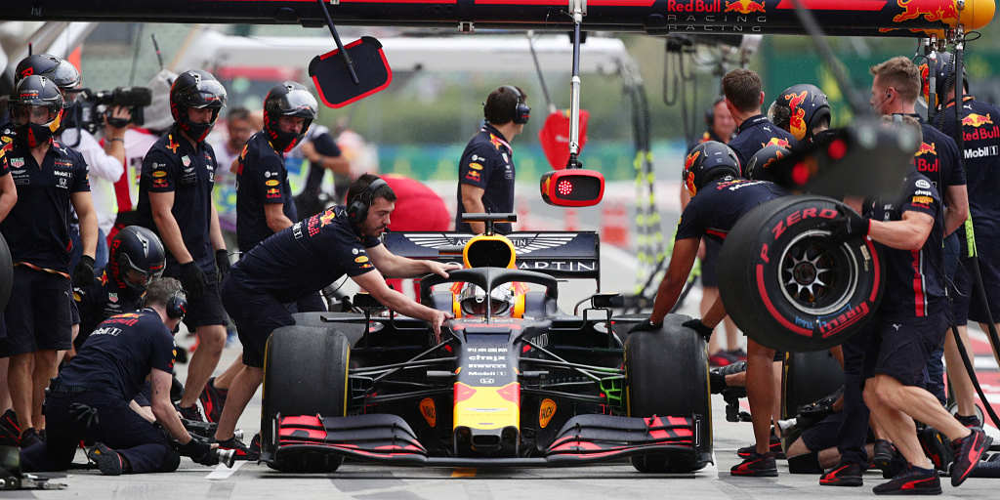

### Which countries are the old and new drivers from?

In [91]:
drivers4 = pd.read_csv('./race-data/drivers.csv', encoding = 'latin1')
drivers4.head()

,driverId,driverRef,number,code,forename,surname,dob,nationality,url
0,1,hamilton,44.0,HAM,Lewis,Hamilton,07/01/1985,British,http://en.wikipedia.org/wiki/Lewis_Hamilton
1,2,heidfeld,NaN,HEI,Nick,Heidfeld,10/05/1977,German,http://en.wikipedia.org/wiki/Nick_Heidfeld
2,3,rosberg,6.0,ROS,Nico,Rosberg,27/06/1985,German,http://en.wikipedia.org/wiki/Nico_Rosberg
3,4,alonso,14.0,ALO,Fernando,Alonso,29/07/1981,Spanish,http://en.wikipedia.org/wiki/Fernando_Alonso
4,5,kovalainen,NaN,KOV,Heikki,Kovalainen,19/10/1981,Finnish,http://en.wikipedia.org/wiki/Heikki_Kovalainen


In [101]:
import datetime as dt

drivers3['dob'] = pd.to_datetime(drivers3['dob'])
old = drivers3[drivers3['dob'].dt.year < 1985]
old.head()

,driverId,driverRef,number,code,forename,surname,dob,nationality,url
1,2,heidfeld,NaN,HEI,Nick,Heidfeld,1977-10-05,German,http://en.wikipedia.org/wiki/Nick_Heidfeld
3,4,alonso,14.0,ALO,Fernando,Alonso,1981-07-29,Spanish,http://en.wikipedia.org/wiki/Fernando_Alonso
4,5,kovalainen,NaN,KOV,Heikki,Kovalainen,1981-10-19,Finnish,http://en.wikipedia.org/wiki/Heikki_Kovalainen
6,7,bourdais,NaN,BOU,SÌ©bastien,Bourdais,1979-02-28,French,http://en.wikipedia.org/wiki/S%C3%A9bastien_Bo...
7,8,raikkonen,7.0,RAI,Kimi,RÌ_ikkÌ¦nen,1979-10-17,Finnish,http://en.wikipedia.org/wiki/Kimi_R%C3%A4ikk%C...


In [102]:
new = drivers3[drivers3['dob'].dt.year > 1985]

30+ Old Drivers Percentage

In [122]:
old_count = old['nationality'].value_counts()
data = [go.Bar(x = old_count.index,
               y = old_count.values,
               marker = dict(color = random_colors(100)))]

layout = dict(title = "Old Drivers Percentage by Countries")
fig = dict(data = data, layout = layout)
iplot(fig, validate = False)

Young Drivers Percentage

In [123]:
new_count = new['nationality'].value_counts()
data = [go.Bar(x = new_count.index,
               y = new_count.values,
               marker = dict(color = random_colors(100)))]

layout = dict(title = "New Drivers Percentage by Countries")
fig = dict(data = data, layout = layout)
iplot(fig, validate = False)

# Analysis of Constructors

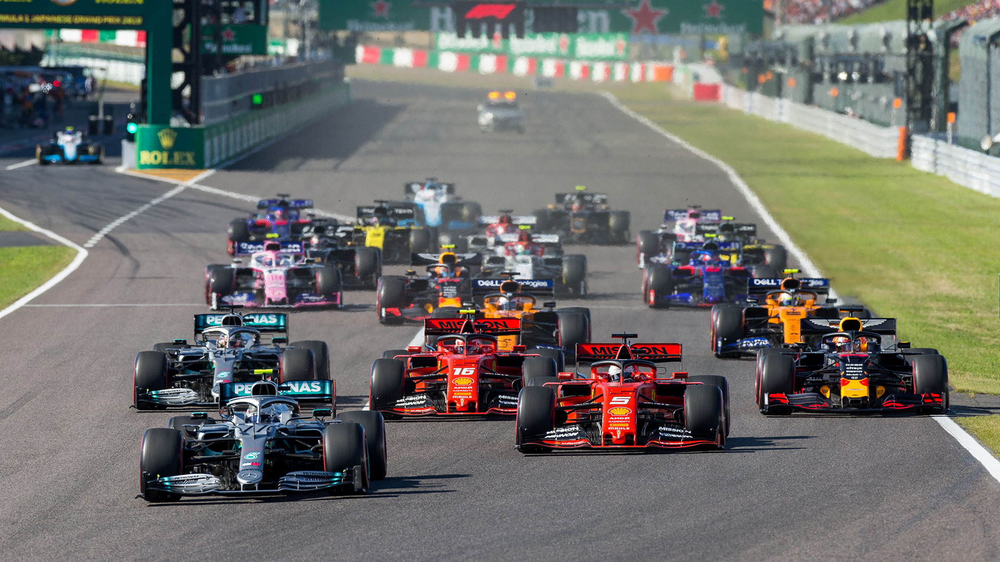

In [127]:
constructors = pd.read_csv('./race-data/constructors.csv')
constructors.head()

,constructorId,constructorRef,name,nationality,url,Unnamed: 5
0,1,mclaren,McLaren,British,http://en.wikipedia.org/wiki/McLaren,NaN
1,2,bmw_sauber,BMW Sauber,German,http://en.wikipedia.org/wiki/BMW_Sauber,NaN
2,3,williams,Williams,British,http://en.wikipedia.org/wiki/Williams_Grand_Pr...,NaN
3,4,renault,Renault,French,http://en.wikipedia.org/wiki/Renault_F1,NaN
4,5,toro_rosso,Toro Rosso,Italian,http://en.wikipedia.org/wiki/Scuderia_Toro_Rosso,NaN


### Which nationality do most constructors belong to?

In [129]:
constructors1 = constructors[['name', 'nationality']]
count = constructors1.groupby(["nationality", "name"]).size().reset_index()

In [130]:
constructors_count = constructors['nationality'].value_counts()
data = [go.Bar(x = constructors_count.index,
               y = constructors_count.values,
               marker = dict(color = random_colors(25)))]

layout = dict(title = "Constructors by Country")
fig = dict(data = data, layout = layout)
iplot(fig, validate = False)

In [131]:
def calculateTextpositions(values):
    total = sum(values)
    # Do not display percentages < 5%
    return map(lambda v: 'none' if float(v)/total < 0.05 else 'auto', values)

In [132]:
constructors_count = constructors['nationality'].value_counts()
trace = go.Pie(labels = constructors_count.index, 
               values = constructors_count.values, 
               hole = 0.6, textinfo = "none")

layout = go.Layout(title = 'Percentage of Constructors by Nationality')
fig = go.Figure(data = [trace], layout = layout)
iplot(fig, filename = "plotting-library")

### Which constructors have won the most number of races?

In [137]:
constructor_standings = pd.read_csv('./race-data/constructorStandings.csv')
constructor_standings.head()

,constructorStandingsId,raceId,constructorId,points,position,positionText,wins,Unnamed: 7
0,1,18,1,14.0,1,1,1,NaN
1,2,18,2,8.0,3,3,0,NaN
2,3,18,3,9.0,2,2,0,NaN
3,4,18,4,5.0,4,4,0,NaN
4,5,18,5,2.0,5,5,0,NaN


In [138]:
constructor_standings = constructor_standings.fillna(0)

In [139]:
constructors = constructor_standings.merge(constructors, how = 'left', on = 'constructorId')

In [141]:
constructors_filtered = constructors[constructors['position'] == 1]
constructors_filtered.head()

,constructorStandingsId,raceId,constructorId,points,position,positionText,wins,Unnamed: 7,constructorRef,name,nationality,url,Unnamed: 5
0,1,18,1,14.0,1,1,1,0.0,mclaren,McLaren,British,http://en.wikipedia.org/wiki/McLaren,NaN
6,7,19,1,24.0,1,1,1,0.0,mclaren,McLaren,British,http://en.wikipedia.org/wiki/McLaren,NaN
18,19,20,2,30.0,1,1,0,0.0,bmw_sauber,BMW Sauber,German,http://en.wikipedia.org/wiki/BMW_Sauber,NaN
33,34,21,6,47.0,1,1,3,0.0,ferrari,Ferrari,Italian,http://en.wikipedia.org/wiki/Scuderia_Ferrari,NaN
44,45,22,6,63.0,1,1,4,0.0,ferrari,Ferrari,Italian,http://en.wikipedia.org/wiki/Scuderia_Ferrari,NaN


In [151]:
# Top 5 Constructors by Race Wins

constructors2 = constructors_filtered['name'].value_counts()
constructors2 = constructors2.head(5)
radar = go.Scatterpolar(r = constructors2.values,
                        theta = constructors2.index,
                        fill = 'toself')

data = [radar]
fig = go.Figure(data = data)
iplot(fig)

In [148]:
constructors_count = constructors_filtered['name'].value_counts()
data = [go.Bar(x = constructors_count.values,
               y = constructors_count.index,
               orientation = 'h',
               marker = dict(color = random_colors(100)))]

layout = dict(title = "Const (Upto 2017)")
fig = dict(data = data, layout = layout)
iplot(fig, validate = False)

In [155]:
win_count = constructors_filtered['name'].value_counts()
trace = go.Pie(labels = win_count.index, 
               values = win_count.values, 
               hole = 0.6, textinfo = 'none')

layout = go.Layout(title = 'Race Win Percentage of Constructors (Upto 2017)')
fig = go.Figure(data=[trace], layout=layout)
iplot(fig, filename="plotting-library")

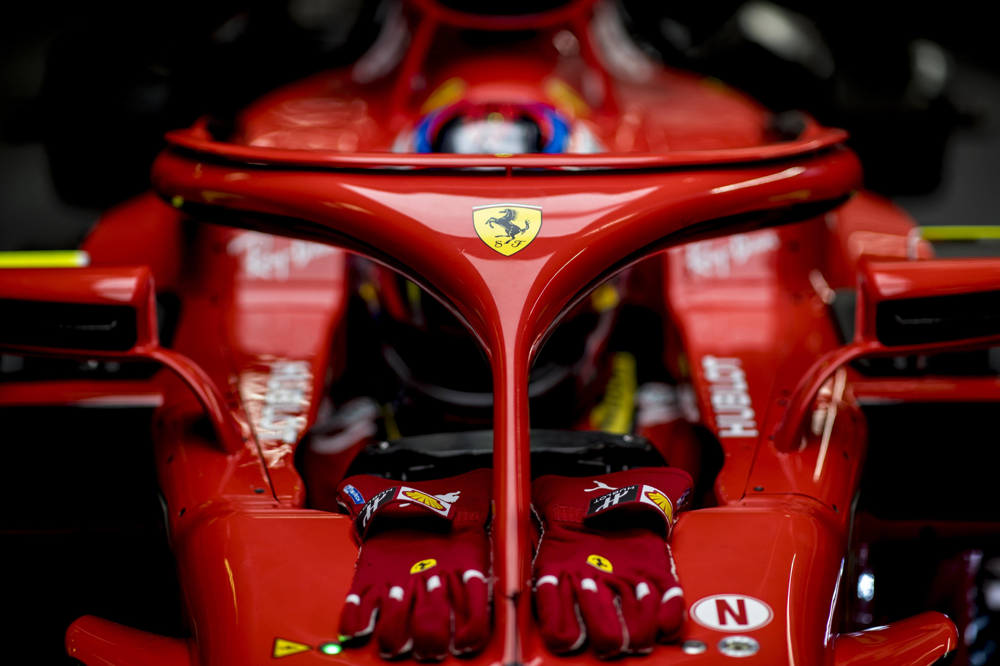

### Total points of constructors over the years

In [187]:
constructor_results = pd.read_csv('./race-data/constructorResults.csv')
constructors2 = pd.read_csv('./race-data/constructors.csv')
constructor_results.head()

,constructorResultsId,raceId,constructorId,points,status
0,1,18,1,14.0,NaN
1,2,18,2,8.0,NaN
2,3,18,3,9.0,NaN
3,4,18,4,5.0,NaN
4,5,18,5,2.0,NaN


In [188]:
results5 = constructors2.merge(constructor_results, how = 'left', on = 'constructorId')
results5.head()

,constructorId,constructorRef,name,nationality,url,Unnamed: 5,constructorResultsId,raceId,points,status
0,1,mclaren,McLaren,British,http://en.wikipedia.org/wiki/McLaren,NaN,1.0,18.0,14.0,NaN
1,1,mclaren,McLaren,British,http://en.wikipedia.org/wiki/McLaren,NaN,14.0,19.0,10.0,NaN
2,1,mclaren,McLaren,British,http://en.wikipedia.org/wiki/McLaren,NaN,25.0,20.0,4.0,NaN
3,1,mclaren,McLaren,British,http://en.wikipedia.org/wiki/McLaren,NaN,35.0,21.0,6.0,NaN
4,1,mclaren,McLaren,British,http://en.wikipedia.org/wiki/McLaren,NaN,46.0,22.0,8.0,NaN


In [189]:
sum_points = results5.groupby('name').sum()
name_sort = results5.sort_values('name')

In [190]:
name_sort = results5.sort_values('name').drop_duplicates('constructorId')
name_sort.head()

,constructorId,constructorRef,name,nationality,url,Unnamed: 5,constructorResultsId,raceId,points,status
10153,147,afm,AFM,German,http://en.wikipedia.org/wiki/Alex_von_Falkenha...,NaN,NaN,NaN,NaN,NaN
7837,39,ags,AGS,French,http://en.wikipedia.org/wiki/Automobiles_Gonfa...,NaN,4326.0,373.0,0.0,NaN
8596,54,ats,ATS,Italian,http://en.wikipedia.org/wiki/ATS_(wheels),NaN,5493.0,450.0,0.0,NaN
10167,161,adams,Adams,American,http://en.wikipedia.org/wiki/Adams_(constructor),NaN,NaN,NaN,NaN,NaN
8394,51,alfa,Alfa Romeo,Italian,http://en.wikipedia.org/wiki/Alfa_Romeo_(Formu...,NaN,5132.0,426.0,0.0,NaN


Sum of all the points won by all the constructors over the years

In [192]:
data = [go.Bar(x = name_sort.name,
               y = sum_points.points,
               marker = dict(color = random_colors(100)))]

layout = dict(title = "Sum of Most Point Won by different constructors")
fig = dict(data = data, layout = layout)
iplot(fig, validate = False)

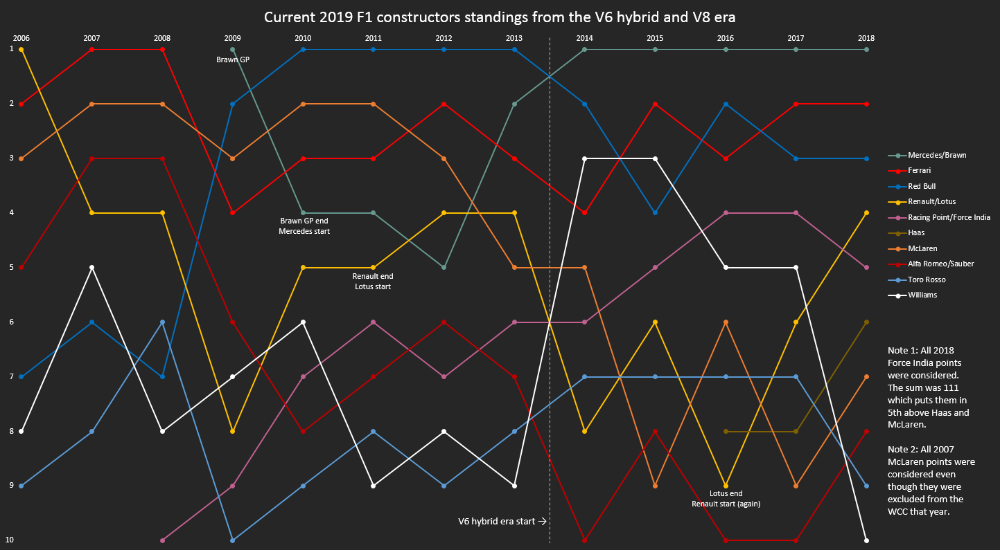